In [16]:
%matplotlib inline

from scipy import misc
import matplotlib.pyplot as plt
import numpy as np
import math
from math import log

# в конечной картинке значения пикселей выше 255 (чем больше доля центра, тем выше зачения и ниже PSNR (<0))
# LoG
# угловые пиксели в зеркальном отражении
# сделала в функциях аргументы по маске и изображению, отражение зеркальное, в центре коэф больше, функция работает, PSNR фигачится
# нужно ли яркость увеличивать

In [17]:
def mirror_frame(img):
    mirr = [[0 for j in range(len(img[0]) + 2)] for i in range(len(img) + 2)]
    mirr_img = np.array(mirr, dtype = float)
    print(len(img), len(mirr), len(img[0]), len(mirr[0]))

    for i in range(len(mirr_img) - 1):
        for j in range(len(mirr_img[0]) - 1):
            if i == 0 and j != len(mirr_img[0]) - 1 and j != 0: # top line without corners 
                mirr_img[i, j] = img[i, j - 1]
            elif j == 0 and i != len(mirr_img) - 1 and i != 0: # left line without corners
                mirr_img[i, j] = img[i - 1, j]
            elif i == len(mirr_img) - 1 and j != len(mirr_img[0]) - 1 and j != 0: # bottom line without corners
                mirr_img[i, j] = img[i - 2, j - 1]
            elif j == len(mirr_img[0]) - 1 and i != len(mirr_img) - 1 and i != 0:
                mirr_img[i, j] = img[i - 1, j - 2]
            elif i != len(mirr_img) - 1 and j != len(mirr_img[0]) - 1:
                mirr_img[i, j] = img[i - 1, j - 1]
    img = mirr_img
    print(len(img))
    img[0, 0] = img[0, 1]
    img[len(img) - 1, len(img[0]) - 1] = img[len(img) - 2, len(img[0]) - 1]
    img[len(img) - 1, 0] = img[len(img) - 1, 1]
    img[0, len(img[0]) - 1] = img[1, len(img[0]) - 1]

In [18]:
def show(arr):
    plt.figure(figsize=(10, 10))
    plt.imshow(arr, interpolation='none', cmap='gray')
    plt.show()

In [19]:
def noise(arr):
    for i in range(len(arr)):
        for j in range(len(arr[0])):
            rand = np.random.normal(0, 30, None)
            arr[i, j] += rand

In [20]:
def denoise_centre(noised_img, denoised_img, mask):
    type(mask)
    sum = int(0)
    mask_sum = 0
    k = 0
    
    for i in range(len(mask)):
        mask_sum += mask[i]
        
    for start_x in range(1, len(noised_img) - 1):
        for start_y in range(1, len(noised_img[0]) - 1):
            for i in range(start_x - 1, start_x + 2):
                for j in range(start_y - 1, start_y + 2):
                    sum += noised_img[i, j] * mask[k] / mask_sum
                    k += 1
            denoised_img[start_x, start_y] = sum
            sum = 0
            k = 0

In [21]:
def diff_count(arr_denoised, original_img):
    sum_diff = 0
    for i in range(len(arr_denoised)):
        for j in range(len(arr_denoised[0])):
            sum_diff += (arr_denoised[i, j] - original_img[i, j]) ** 2
    print("RMSE: ", math.sqrt(sum_diff / (len(arr_denoised) * len(arr_denoised[0]))))
    mse = sum_diff / (len(arr_denoised) * len(arr_denoised[0]))
    print("MSE: ", mse)
    psnr = 10 * math.log10(math.pow(arr_denoised[i, j].max(), 2) / mse)
    print("PSNR: ", psnr)
    return psnr

In [22]:
def brightness(arr):
    for i in range(len(arr)):
        for j in range(len(arr[0])):
            if arr[i, j] > 200:
                arr[i, j] += 15

In [23]:
def noise_diff():
    sum_noised = 0
    for i in range(len(arr)):
        for j in range(len(arr[0])):
            sum_noised += (arr_noised[i, j] - original_img[i, j]) ** 2
    print("Difference: ", math.sqrt(sum_noised / (len(arr) * len(arr[0]))))

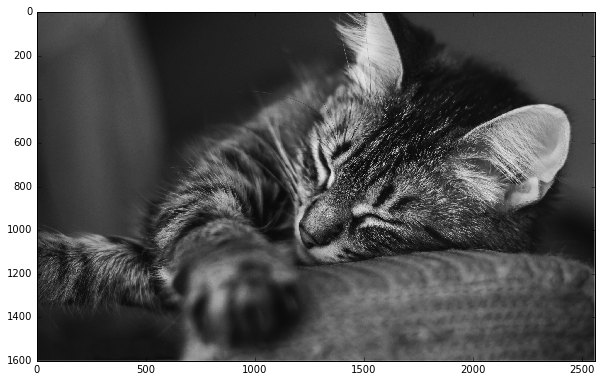

250.0


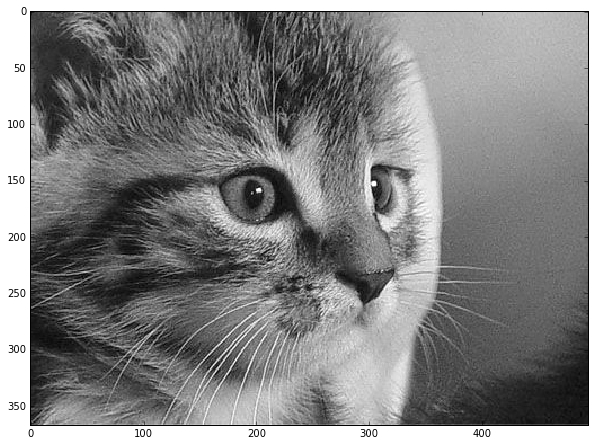

255.0


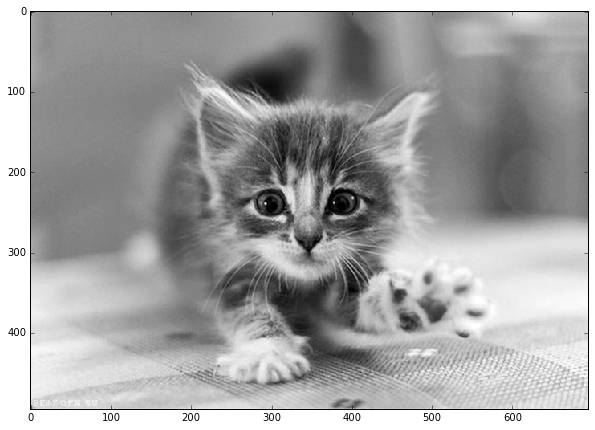

255.0


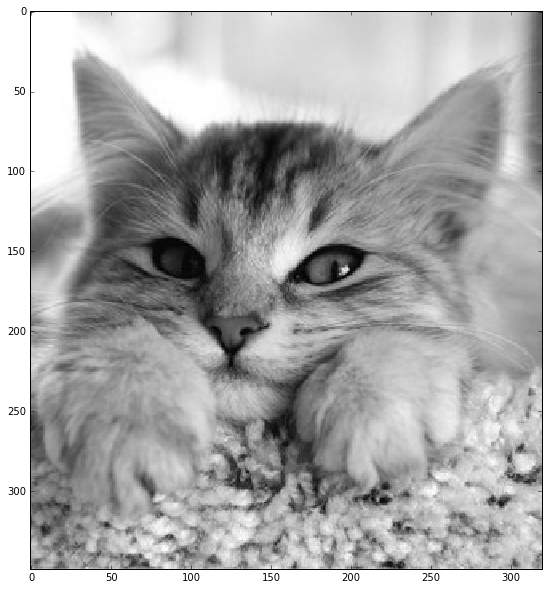

255.0


In [24]:
img_arr = []
img_arr.append(misc.imread('sleep.png'))
img_arr.append(misc.imread('cat_grey.png'))
img_arr.append(misc.imread('kitten.png'))
img_arr.append(misc.imread('small.png'))

for i in range(len(img_arr)):
    original_img.append(np.array(img_arr[i], dtype = float))
    noised_img.append(np.array(img_arr[i], dtype = float))
    denoised_img.append(np.array(img_arr[i], dtype = float))
    show(img_arr[i])
    print(original_img[i].max())

1600 1602 2560 2562
1602
255.0


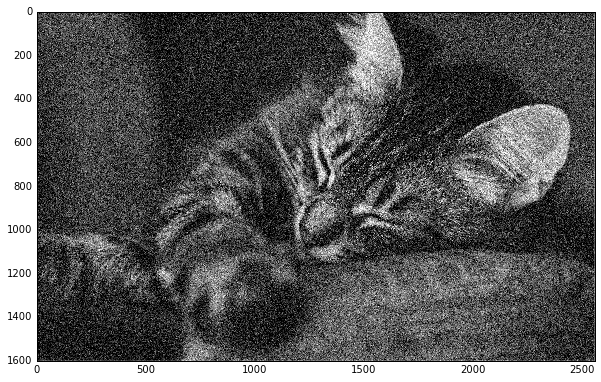

367 369 495 497
369
255.0


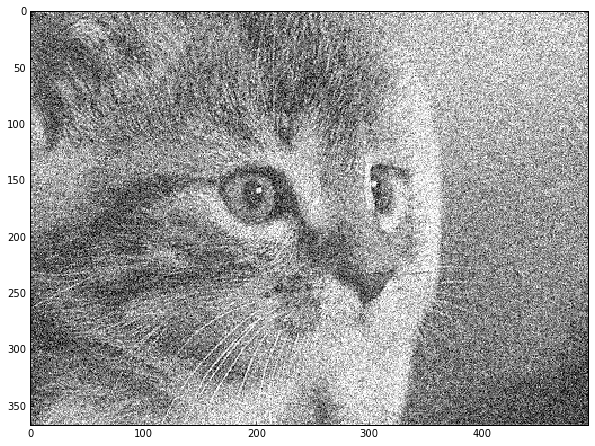

495 497 695 697
497
255.0


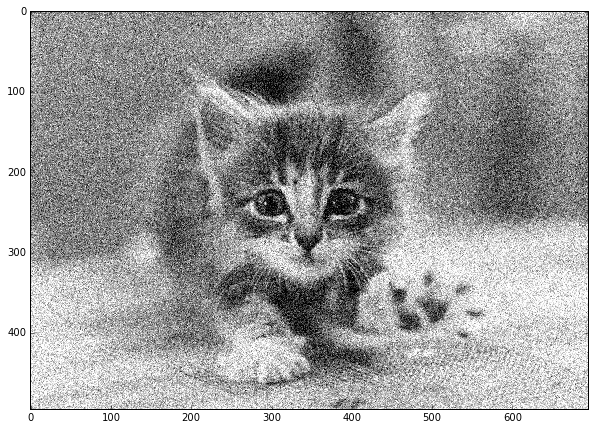

349 351 320 322
351
255.0


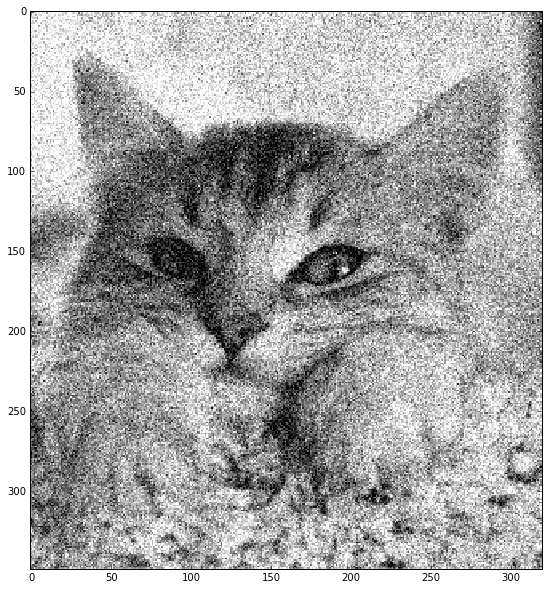

In [25]:
for i in range(len(img_arr)):
    noise(noised_img[i]) # to remember 
    mirror_frame(noised_img[i])

    np.clip(noised_img[i], 0, 255, out=noised_img[i])
    print(noised_img[i].max())
    show(noised_img[i])
    
    ### denoised_img[i] = noised_img[i] # for further denoising

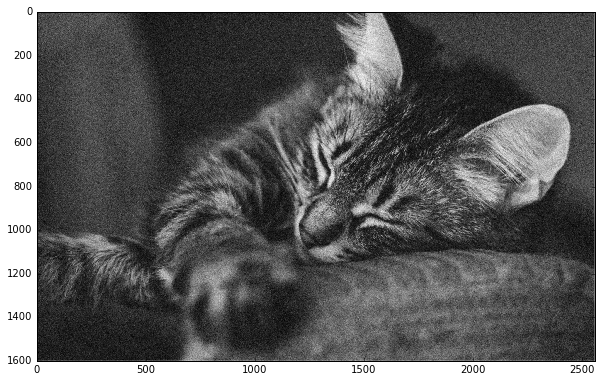

RMSE:  14.624209354050835
MSE:  213.867499231
PSNR:  10.32337683527154


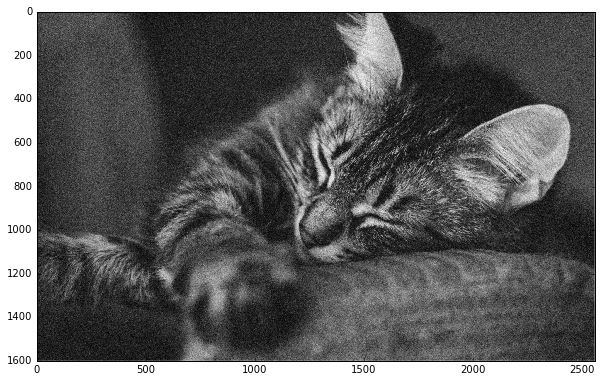

RMSE:  15.74727183443149
MSE:  247.976570227
PSNR:  9.680718257862853


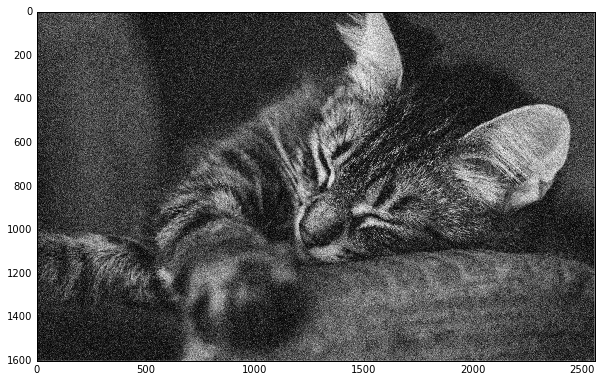

RMSE:  22.113307509396464
MSE:  488.998369005
PSNR:  6.731750641618145


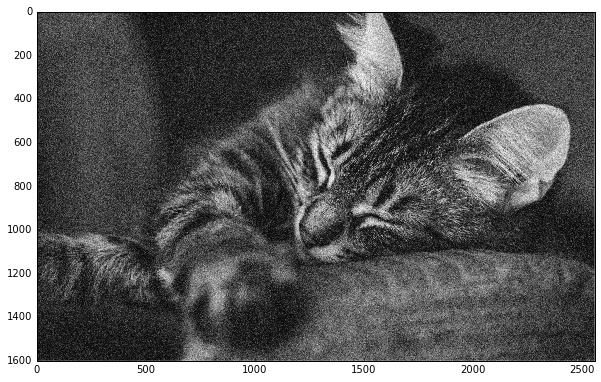

RMSE:  21.08770078950946
MSE:  444.691124588
PSNR:  7.144240131254344


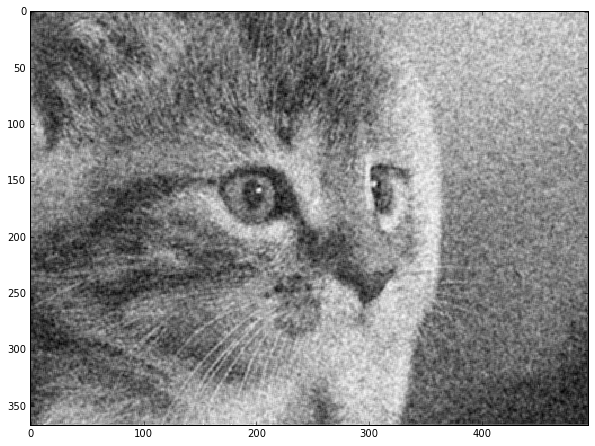

RMSE:  17.614512749054246
MSE:  310.271059387
PSNR:  13.144387054408535


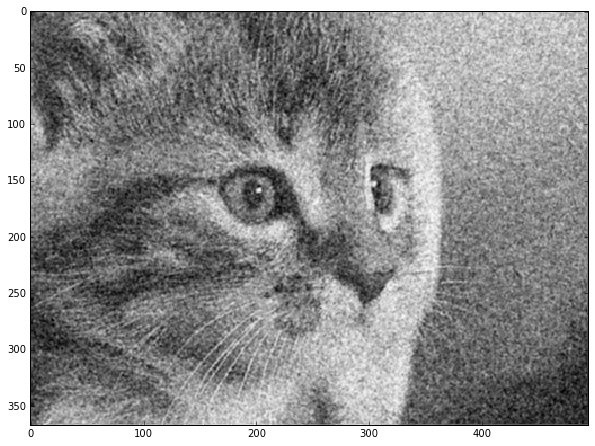

RMSE:  17.81382701636623
MSE:  317.332432969
PSNR:  13.046655125369576


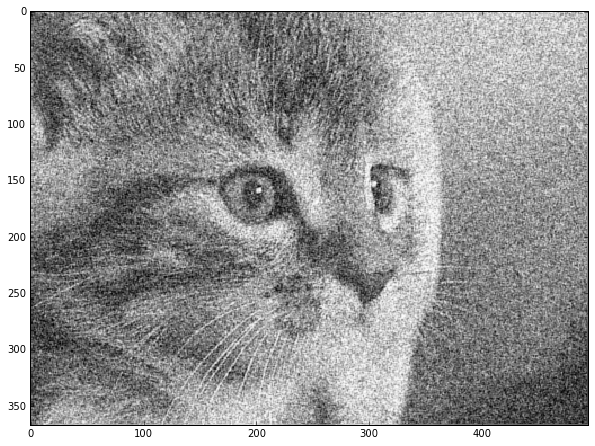

RMSE:  23.59936690809769
MSE:  556.930118463
PSNR:  10.603792690612714


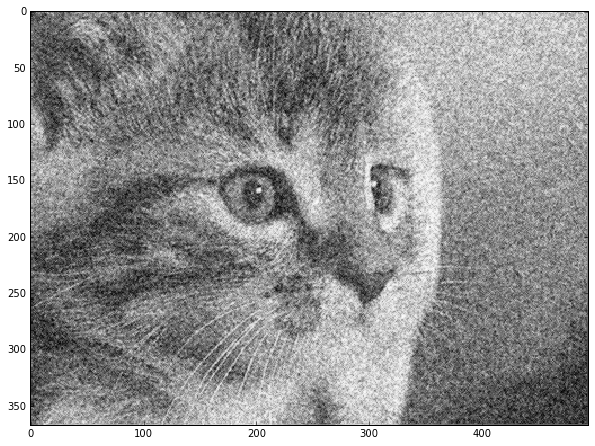

RMSE:  22.72162475045857
MSE:  516.272231301
PSNR:  10.933012076761967


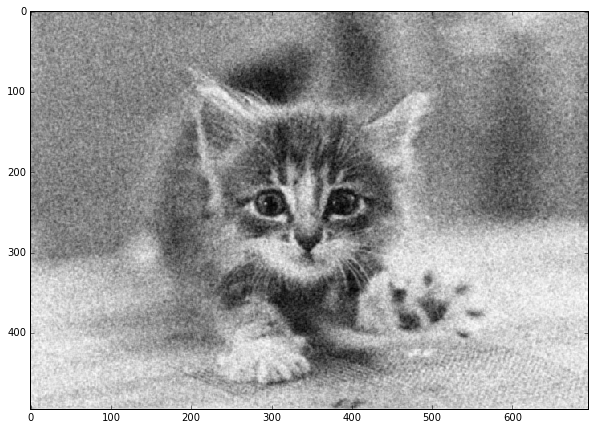

RMSE:  14.27473725847545
MSE:  203.768123799
PSNR:  22.972558681497812


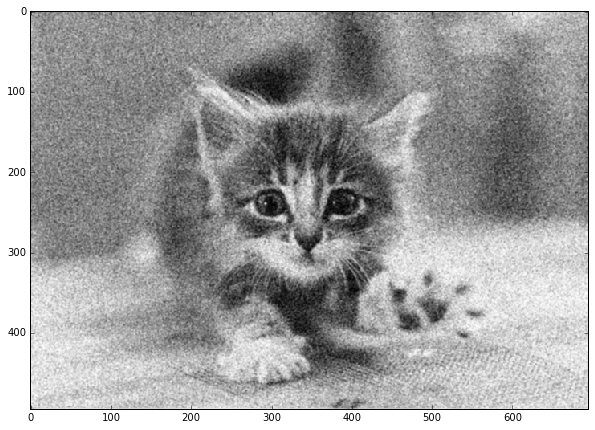

RMSE:  15.695104739180747
MSE:  246.336312774
PSNR:  22.148636783373217


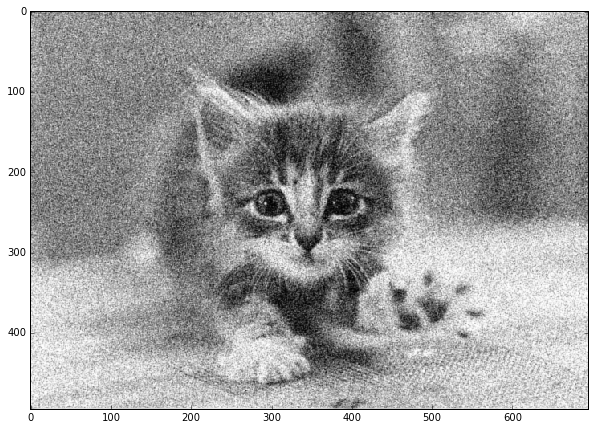

RMSE:  22.695406201068927
MSE:  515.081462632
PSNR:  18.9451619458903


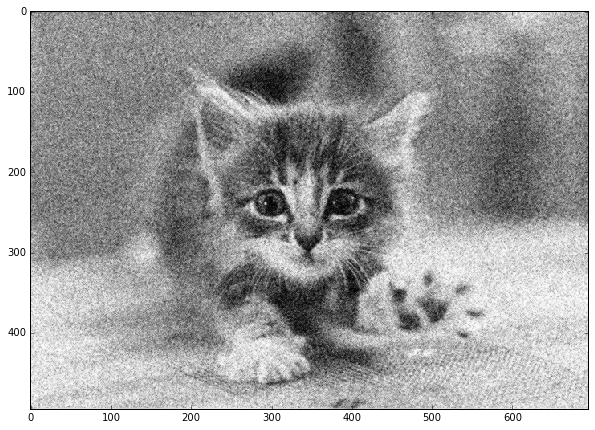

RMSE:  21.616058732175034
MSE:  467.253995113
PSNR:  19.368390914716624


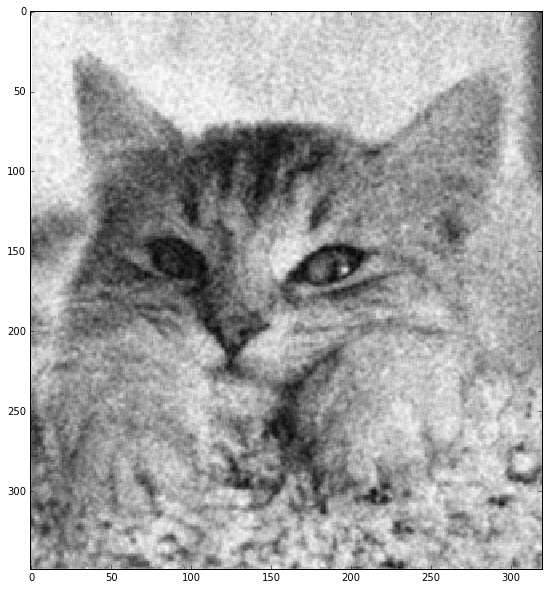

RMSE:  15.478336137977102
MSE:  239.5788896
PSNR:  20.12350757103079


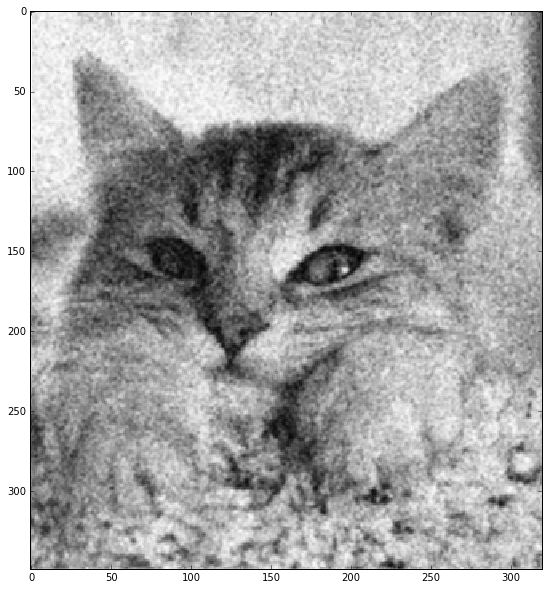

RMSE:  16.4452183743731
MSE:  270.445207381
PSNR:  19.59720015200513


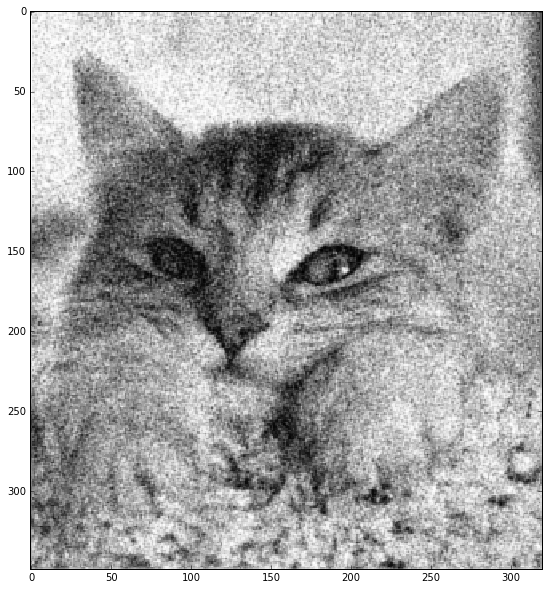

RMSE:  22.712094649891313
MSE:  515.839243386
PSNR:  16.79284926036489


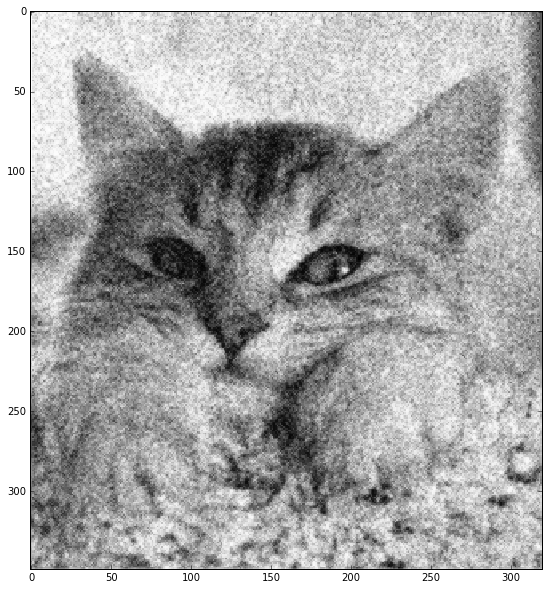

RMSE:  21.75348972121174
MSE:  473.214315051
PSNR:  17.167414309640872


In [43]:
masks = np.array([
    [1, 1, 1, 1, 1, 1, 1, 1, 1],
    [1, 2, 1, 2, 4, 2, 1, 2, 1],
    [0, 1, 0, 1, 4, 1, 0, 1, 0],
    [1, 1, 1, 1, 8, 1, 1, 1, 1]])

psnr_img_arr = []

for i in range(len(img_arr)):
    psnr_arr = []
    for mask in masks:
        denoise_centre(noised_img[i], denoised_img[i], mask)
        show(denoised_img[i])
        psnr_arr.append(diff_count(denoised_img[i], original_img[i]))
    # print(psnr_arr)
    psnr_img_arr.append(psnr_arr)

[10.32337683527154, 9.680718257862853, 6.731750641618145, 7.144240131254344]
[13.144387054408535, 13.046655125369576, 10.603792690612714, 10.933012076761967]
[22.972558681497812, 22.148636783373217, 18.9451619458903, 19.368390914716624]
[20.12350757103079, 19.59720015200513, 16.79284926036489, 17.167414309640872]


[]

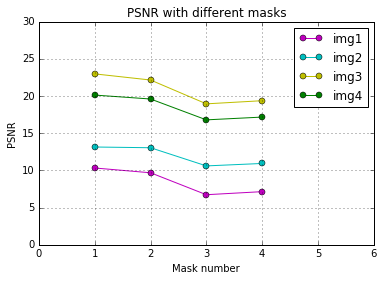

In [52]:
X = [1, 2, 3, 4]
colors = ('m', 'c', 'y', 'g')
imgs = ['img1', 'img2', 'img3', 'img4']

for i in range(len(psnr_img_arr)):
    Y = psnr_img_arr[i]
    line = plt.plot(X, Y, linestyle='-', marker='o', label=imgs[i])
    plt.setp(line, color=colors[i])
    print(psnr_img_arr[i])

plt.axis([0, 6, 0, 30])

plt.title('PSNR with different masks')

plt.xlabel('Mask number')
plt.ylabel('PSNR')

plt.grid()
plt.legend()
plt.plot()